<p><img alt="Colaboratory logo" height="45px" src="/img/colab_favicon.ico" align="left" hspace="10px" vspace="0px"></p>

<h1>4 Asheville Urban Renewal</h1>

Team members include:
- Anna KAFRUNE
- Daniel RONG (leader)
- Xander SMEAD
- Yicheng WANG
- Zhaojie YIN


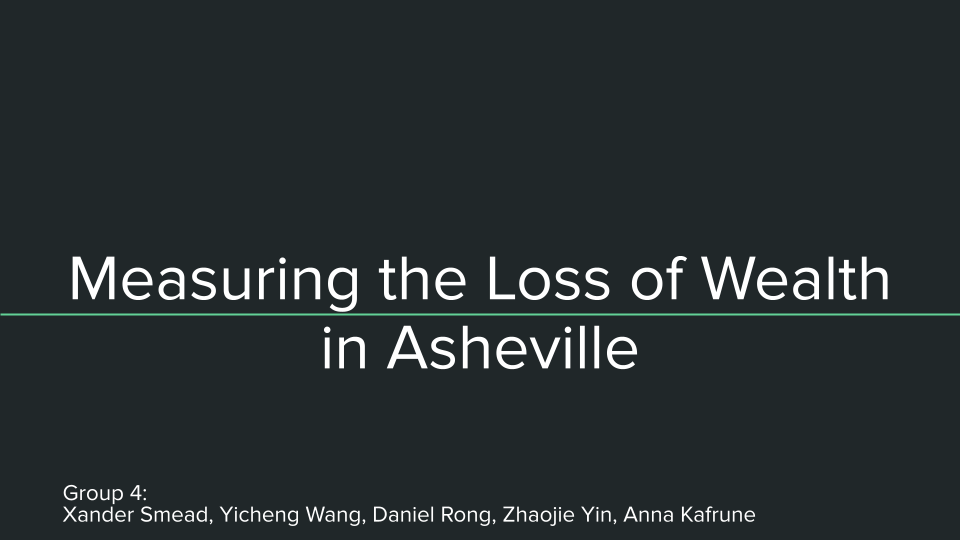

## **Background on Urban Renewal**

The urban renewal project specific to Asheville took place betwee the 60's and the 90's. It most heavily impacted the neighborhod know as East Riverside. This neighborhood housed more than 50% of the city's African American residents. The city of Asheville used the power of eminent domain to uproot African American families and businesses, taking away homeownership, and affecting generational wealth. The residents and busineess owners were given money based on the apprasials of their properties, but in taking away their ownership of a home, the city also robbed them of the value of owning a home that can be passed down through families and create stability through generations. 

## **Methods Used**

With this project we set out to calculate just how much generational wealth was taken from these citizens of Asheville. There were a few different methodst that we used to asses this. First, we used QGIS to match up the parcel division map from the 60’s with a map of the parcels how they are today. With this we were able to tell how the individual parcels from the 60’s were combined into larger parcels today and could compare the values that way.
We then collected metadata about the parcels such as their appraisal rates in order to use that information to calculate the value the properties would have today.
We coded a calculator (as seen below) that took each properties value from the 60’s and calculated how much it would have increased over time based on inflation rates.


## **QGIS**

 **Why we use QGIS?**

Quantum GIS (QGIS) is an open-source Geographic Information System that supports most geospatial vector and raster file types and database formats. We want to utilize QSGS to present the changes in building layout in the Ashville area between 1960 and today, and further reproduce for the rest of the city to calculate the stolen wealth from every single property that was repossessed. 

**Where do we focus on?**

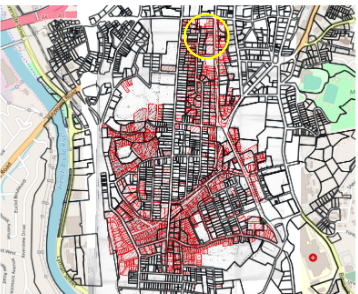

This is the entire map containing the data we have for the whole city of Asheville. The yellow circle shows block 4, the part that we have been worked with. 

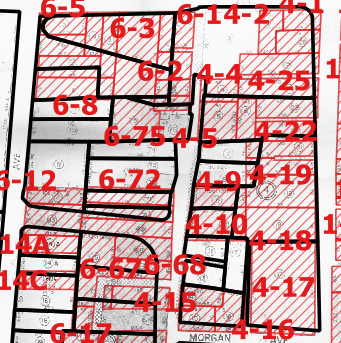
  **(Zoom into block 4)**

**What we get from block 4?**

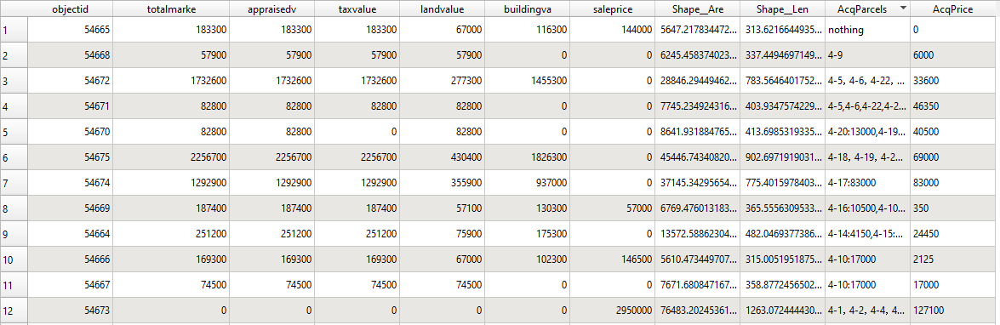

We manually generate a table to record the objects that corresponded to each parcel in the 1960s,  and to summarize their values in order to compare to the market value today, leading to present the growth rate of the value.
(For the overlapping parts, we calculate the approximate value based on the ratio of the area)

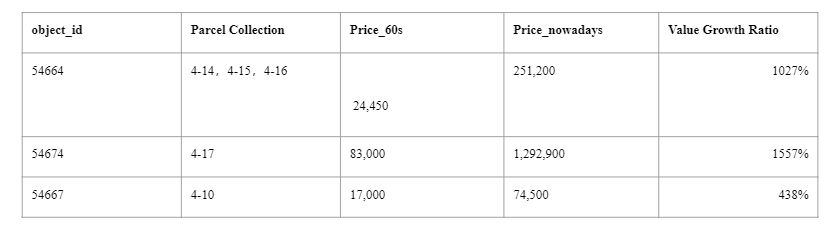

Here are some records comparing the values of the selected parcels nowadays with those of the 1960s. We can tell the value has increased at least 4 times。

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
df= pd.read_csv('QGIS.csv')
data=df[['objectid','saleprice','AcqPrice']]
data

,objectid,saleprice,AcqPrice
0,54668,0,6000
1,54672,0,33600
2,54671,0,46350
3,54670,0,40500
4,54675,0,69000
5,54674,0,83000
6,54669,57000,350
7,54664,0,24450
8,54666,146500,2125
9,54667,0,17000


[Text(0, 0.5, 'Total_price')]

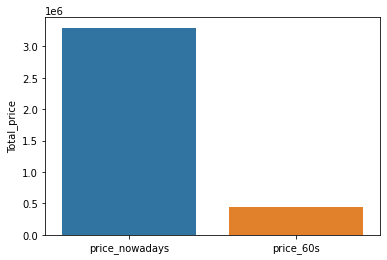

In [ ]:
price_nowadays=df.saleprice.sum()
price_60s=df.AcqPrice.sum()
sns.barplot(x=['price_nowadays','price_60s'], y=[price_nowadays,price_60s]
                 ).set(ylabel='Total_price')

We also visualize the total market value to illustrate the change in value across block 4. We can see that the value appreciation is close to 7 times as much, which reveals the magnitude of the economic loss to residents.

## **Background on Data**

**Where do we find our data?**

Official city files are the main resource of our data.
We have 60 scanned pages from Block 53 to Parcel 1, which covers 9 buildings in Ashville in totla. These buidlings include one business and seventeen families.
We also gathered rental agreements, establishment of rental charges, deeds, claims for relocation payments, descriptions of improvements property inspections, and photos that related to all our blocks.

These documentation that proves the relocation of a large number of Ashville citizens from their homes.

Moreover, we have an interactive scanned map which showed in the QGIS section that could view the histories of the block including information such as appraiser, court award, decision, offer made, transfer of deed, acquired by urban renewe

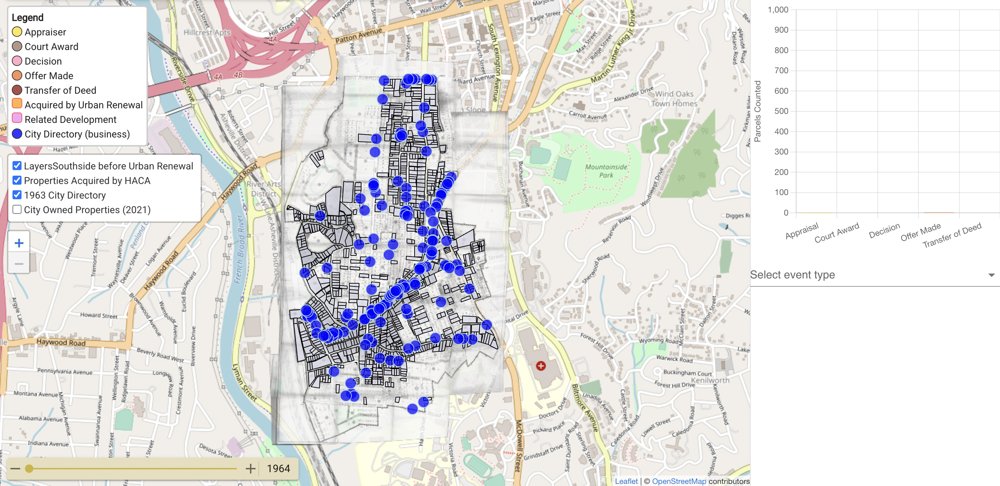...

**Data**

With all the information provided by the documentation, we have filtered our data for our calculations.

Here list all the main data we need and the name to put into excel file for future uses.

- Block number

- Parcel number

- Money

- Appraisal year

- Event id, parcel id, type id, person id

- Response

- Name

- Land use

- Street name


**Examples of our data set**

DATASE

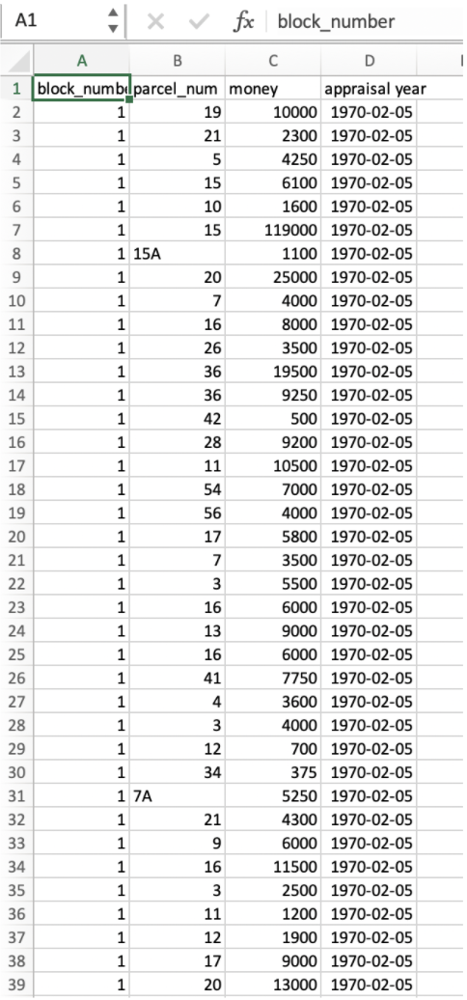

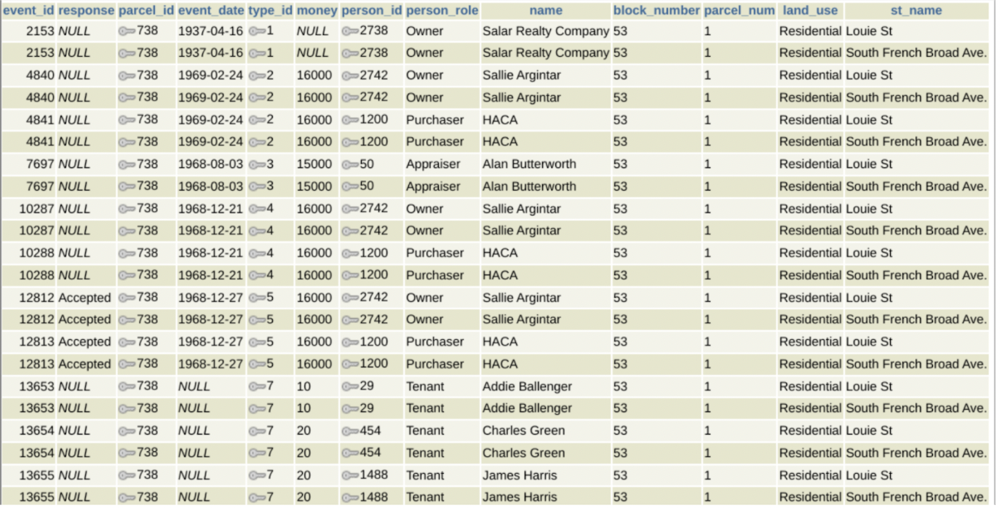

## **Calculator**

Based on the possibilities of calculation methods and the available data, we decided to program a calculator that uses the yearly inflation in the US. What we get from it is a way to calculate what the properties’ appraisal value that were determined since around the 1960s would be in 2020.

**But why create our own calculator?**

We did have options of existing online calculators to use, such as the one on [Measuringworth](https://www.measuringworth.com/) website, which provides an expected value for each property’s current worth in today’s dollar. However, our calculator allows for a more efficient process of calculation for our project and provides results for the current worth of the properties based on the properties’ individualities.


**Subsetting Block 4 properties from the rest of the dataset with all blocks:**

In [ ]:
import sqlite3
import pandas as pd

In [ ]:
inflation_df = pd.read_csv("inflation.csv")
inflation_df.head()

,year,inflation_rate
0,1960,0.0146
1,1961,0.0107
2,1962,0.0120
3,1963,0.0124
4,1964,0.0128


In [ ]:
urm_df = pd.read_csv("urban_renewal_money_i.csv")
urm_df.head()

,block_number,parcel_num,money,appraisal_date
0,5,19,10000,2/5/1970
1,1,21,2300,2/5/1970
2,76,5,4250,2/5/1970
3,59,15,6100,2/5/1970
4,37,10,1600,2/5/1970


In [ ]:
# selects only the rows with data from block 4
con = sqlite3.connect('m5_database.sqlite')
urm_df.to_sql('urm_tbl',con,if_exists='replace')
query_block_4 = "SELECT * FROM urm_tbl WHERE block_number = 4"
urm_df_block_4 = pd.read_sql_query(query_block_4,con)
urm_df_block_4

,index,block_number,parcel_num,money,appraisal_date
0,31,4,9,6000,2/5/1970
1,37,4,20,13000,2/5/1970
2,45,4,19,27500,2/5/1970
3,62,4,25,15000,9/7/1968
4,260,4,18,20000,8/21/1968
5,281,4,16,10500,8/7/1968
6,284,4,6,4000,8/7/1968
7,357,4,15,9800,7/20/1968
8,362,4,26,7600,7/20/1968
9,478,4,21,8500,8/7/1968


In [ ]:
import datetime
urm_df_block_4['year'] = urm_df_block_4['appraisal_date'].apply(lambda x: datetime.datetime.strptime(x, '%m/%d/%Y').strftime('%Y'))
urm_df_block_4

,index,block_number,parcel_num,money,appraisal_date,year
0,31,4,9,6000,2/5/1970,1970
1,37,4,20,13000,2/5/1970,1970
2,45,4,19,27500,2/5/1970,1970
3,62,4,25,15000,9/7/1968,1968
4,260,4,18,20000,8/21/1968,1968
5,281,4,16,10500,8/7/1968,1968
6,284,4,6,4000,8/7/1968,1968
7,357,4,15,9800,7/20/1968,1968
8,362,4,26,7600,7/20/1968,1968
9,478,4,21,8500,8/7/1968,1968


**Performing the calculation and outputting the gathered results:**

In [ ]:
level1_urm_df_block_4 = urm_df_block_4
def save(level1_block_4_2020):
  level1_urm_df_block_4['2020_value']= level1_block_4_2020

In [ ]:
level1_block_4_2020 = []
for parcel in range(len(urm_df_block_4)):
  current_value = float(urm_df_block_4['money'][parcel])
  y = int(urm_df_block_4['year'][parcel])-1960
  for rate in inflation_df['inflation_rate'][y:]:
    if rate < 0:
      current_value -= current_value * float(rate)
    else:
      current_value += current_value * float(rate)
  level1_block_4_2020.append(format(current_value,",.2f"))
  print(f"Parcel number {urm_df_block_4['parcel_num'][parcel]}'s worth is ${current_value:,.2f} in 2020.")
save(level1_block_4_2020)

Parcel number 9's worth is $42,633.37 in 2020.
Parcel number 20's worth is $92,372.30 in 2020.
Parcel number 19's worth is $195,402.94 in 2020.
Parcel number 25's worth is $117,202.48 in 2020.
Parcel number 18's worth is $156,269.97 in 2020.
Parcel number 16's worth is $82,041.74 in 2020.
Parcel number 6's worth is $31,253.99 in 2020.
Parcel number 15's worth is $76,572.29 in 2020.
Parcel number 26's worth is $59,382.59 in 2020.
Parcel number 21's worth is $66,414.74 in 2020.
Parcel number 10's worth is $35,160.74 in 2020.
Parcel number 4's worth is $58,074.82 in 2020.
Parcel number 17's worth is $343,793.94 in 2020.
Parcel number 24's worth is $82,041.74 in 2020.
Parcel number 23's worth is $68,368.11 in 2020.
Parcel number 14's worth is $33,324.22 in 2020.
Parcel number 5's worth is $52,350.44 in 2020.
Parcel number 1's worth is $67,977.44 in 2020.
Parcel number 2's worth is $59,382.59 in 2020.
Parcel number 22's worth is $66,338.77 in 2020.


In [ ]:
#level1_urm_df_block_4 = level1_urm_df_block_4.style.hide_index()
level1_urm_df_block_4

,index,block_number,parcel_num,money,appraisal_date,year,2020_value
0,31,4,9,6000,2/5/1970,1970,"42,633.37"
1,37,4,20,13000,2/5/1970,1970,"92,372.30"
2,45,4,19,27500,2/5/1970,1970,"195,402.94"
3,62,4,25,15000,9/7/1968,1968,"117,202.48"
4,260,4,18,20000,8/21/1968,1968,"156,269.97"
5,281,4,16,10500,8/7/1968,1968,"82,041.74"
6,284,4,6,4000,8/7/1968,1968,"31,253.99"
7,357,4,15,9800,7/20/1968,1968,"76,572.29"
8,362,4,26,7600,7/20/1968,1968,"59,382.59"
9,478,4,21,8500,8/7/1968,1968,"66,414.74"


You can see the change from the appraisal value (money) to the 2020’s value (2020_value) highlighted in the dataframe on the right.

Next, let's take a closer look on a few of the properties in block four. Specifically parcels 1, 2, and 3.

On the left, there is the map of block 4. In the center there is a picture of the property and the timeline of events related to the properties’ appraisal and transfer and the people involved in this process. And below, there is the appraisal value, date, and the 2020 value we calculated.

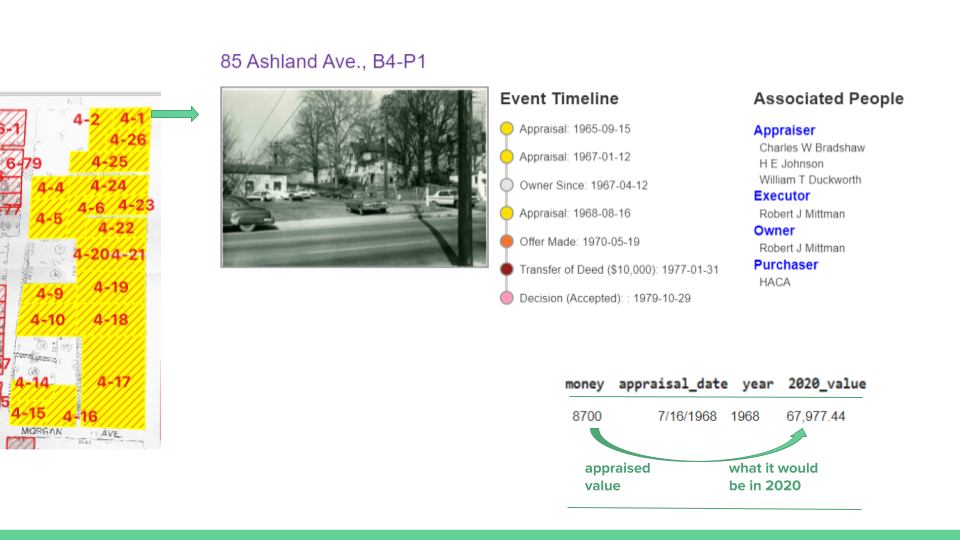

Parcel 1, in 85 Ashland Avenue, was owed by Robert J. Mittman and appraised at 8,700 dollars in 1969 and the property value in 2020 would be around 67,977 dollars.

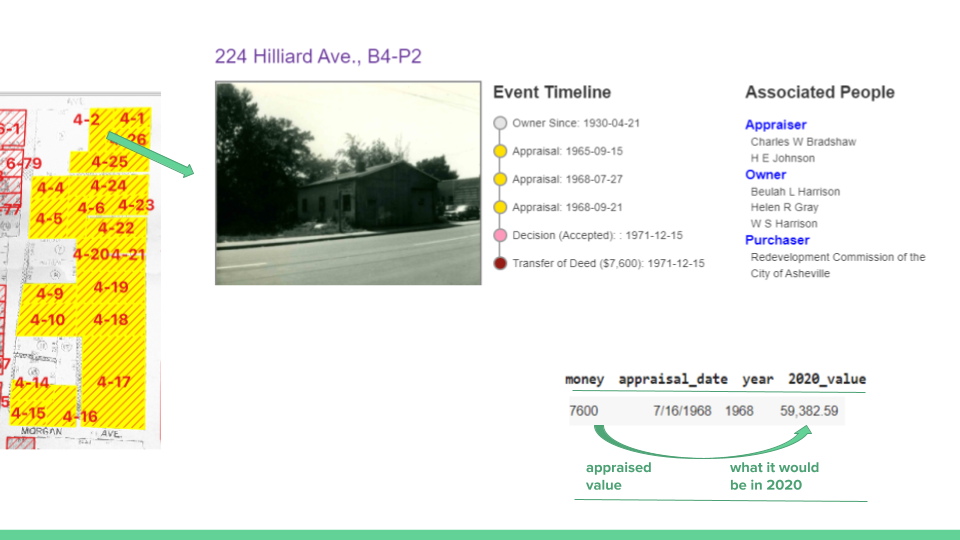

Parcel 2, in 224 Hilliard Avenue, was owed by the Harrison and Gray families and appraised at 7,600 dollars in 1968 and the property value in 2020 would be around 59,382 dollars.

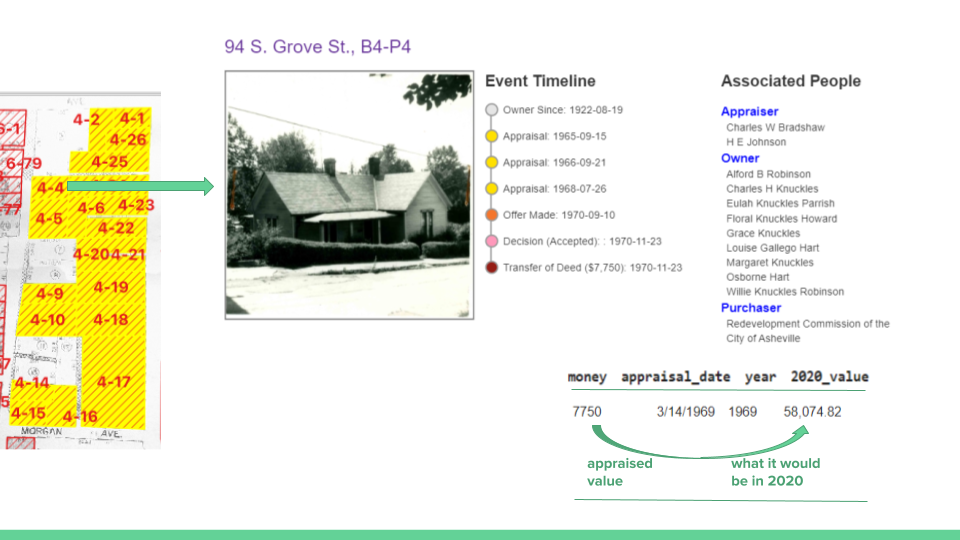

Parcel 3, in 94 S. Grove Street, was owed by the Knuckles, Robinson, and Hart families and appraised at 7,750 dollars in 1969 and the property value in 2020 would be around 58,074 dollars.


One future development that could be made is gathering data on other appraisal points in the properties’ histories, such as when the government sold them to evaluate the extent of the change that had already happened in this shorter period of time.

### **Theoretical future use**

Our findings only dealt with inflation rates. Future research could be done to see what else would have an impact on housing prices. This would better help approximate how much money the city of Asheville needs to prepare for reparations. 

It should also be noted that other cities have had similar urban renewal projects that acquired private homes. This project only hints at the impact of other urban renewal projects in other cities across the US. Hopefully this is at least a step in the right direction for encouraging other cities to also form reparation committees 


## More Resources

- **Video:**
  - Sep. 17, 2020: "How 'urban renewal' displaced thousands of Black people after WWII
    - https://abcnews.go.com/Nightline/video/urban-renewal-displaced-thousands-black-people-wwii-73073717
  - Wed. Sep. 22, 2021: By the numbers: Taking a look at homes sold during Asheville's urban renewal projects
    - https://wlos.com/news/local/by-the-numbers-taking-a-look-at-homes-sold-during-ashevilles-urban-renewal-projects
  - Thu. Sep. 23, 2021: Future of Asheville's reparations to Black community uncertain but imminent
    - https://wlos.com/news/news-13-investigates/future-of-ashevilles-reparations-to-black-community-uncertain-but-imminent 
- **News:**
  - Sep. 21, 2021; From redlining to urban renewal: The lasting impacts on many of Asheville's Black families:  See [LINK](https://wlos.com/news/local/from-redlining-to-urban-renewal-the-lasting-impacts-on-many-of-ashevilles-black-families)
- **Event:** The Fourth Thursday: "Urban Renewal Impact" in Asheville: [LINK]( https://ai-collaboratory.net/2021/06/24/june-24-2021-launch-of-the-urban-renewal-impact-website-initiative/)
  - 7 video parts: #3, #4, and in particular #6 (digital storytelling) are good places to start
    - Richard M.'s #3 talk materials:
      - slides:
      - video segment  is at: [LINK](https://www.youtube.com/watch?v=nqSVrfSCVZc)
 
- **Website:**
  - Urban Renewal Impact: https://urbanrenewalimpact.org/
  - About -> Timeline
  - About -> Research: [2010 Crossroads](https://www.yumpu.com/en/document/read/8229229/twilight-of-a-neighborhood-north-carolina-humanities-council) & [Flickr](https://www.flickr.com/photos/buncombecounty/albums/72157626579451741/https://www.flickr.com/photos/buncombecounty/albums/72157626579451741/)
  - About -> Impact: Baldwin:
https://www.youtube.com/watch?v=T8Abhj17kYU
- **Collection / Data:**
  - Collection / Data:
Collection: LINK Download LINK
  - B53-P1:
    - scanned docs:
    - scanned map: 
  - Data Model: LINK Download LINK
  - TABLE Data for B53-P1: LINKJoined-Table-from-DB.pdf Download Joined-Table-from-DB.pdf
  - Watch "The Fourth Thursday" presentation #4:
https://www.youtube.com/watch?v=8dx26CaPt2g 
  - Interactive Map: http://34.139.36.112/map
  - ACQUSITION FINAL PRICE: urban_renewal_money.csv 